Detección de Cráteres en Imágenes Lunares y Marcianas


En este proyecto, nos enfrentamos al emocionante desafío de detectar cráteres en imágenes de superficies lunares y marcianas. La detección de objetos en imágenes es una tarea fundamental en el campo de la visión por computadora y juega un papel crucial en la exploración espacial, la geología planetaria y la investigación científica. Con la ayuda de la biblioteca de código abierto TorchVision y nuestro profundo interés en la exploración espacial, hemos emprendido este proyecto con el objetivo de desarrollar un sistema de detección de cráteres preciso y eficiente.

Selección de Modelo Alternativo:

Para llevar a cabo esta tarea, hemos decidido utilizar un modelo de detección de objetos diferente al proporcionado en el proyecto original. En lugar de utilizar el modelo RetinaNet, hemos optado por entrenar y desplegar un modelo llamado fasterrcnn_mobilenet_v3_large_fpn. Nuestra elección se basa en la eficiencia y el rendimiento de este modelo, lo que lo hace especialmente adecuado para aplicaciones en las que los recursos computacionales pueden ser limitados.

Cambios Significativos:

Hemos realizado una serie de cambios significativos en el código proporcionado, incluyendo la adaptación del código para funcionar con el nuevo modelo, ajustes en la forma en que se presentan las predicciones, y la implementación de un cálculo de cuadros por segundo (FPS) promedio. Estos cambios tienen como objetivo mejorar la eficiencia y la precisión de nuestra detección de cráteres.

En el transcurso de este proyecto, compartiremos los detalles de nuestro proceso, desde la configuración del modelo hasta la evaluación y la visualización de resultados. Esperamos que esta exploración en la detección de objetos en imágenes lunares y marcianas sea un viaje fascinante y educativo.

¡Acompáñanos mientras desentrañamos los misterios de estas superficies planetarias a través de la detección de cráteres!





In [55]:
  !pip install gdown
!gdown https://drive.google.com/uc?id=1hrHgANwgC8VyXLhXgxLYHTrILpeJ5bLl
!unzip /content/mars_and_moon.zip

Downloading...
From: https://drive.google.com/uc?id=1hrHgANwgC8VyXLhXgxLYHTrILpeJ5bLl
To: /content/mars_and_moon.zip
100% 77.6M/77.6M [00:00<00:00, 148MB/s]
Archive:  /content/mars_and_moon.zip
replace best.pt? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

Descargamos las imagenes

In [56]:
# Download TorchVision repo to use some files from
# references/detection
!git clone https://github.com/pytorch/vision.git
!cd vision
!git checkout v0.8.2

!cp ./vision/references/detection/utils.py ./
!cp ./vision/references/detection/transforms.py ./
!cp ./vision/references/detection/coco_eval.py ./
!cp ./vision/references/detection/engine.py ./
!cp ./vision/references/detection/coco_utils.py ./

!pip install cython
# Install pycocotools, the version by default in Colab
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install -U albumentations
!pip install -U opencv-python

#Copy and unify the train and validation datasets into one folder for images and another for labels
!mkdir ./train
!cp -a /kaggle/input/martianlunar-crater-detection-dataset/craters/train/images/. ./train/images/
!cp -a /kaggle/input/martianlunar-crater-detection-dataset/craters/valid/images/. ./train/images/
!cp -a /kaggle/input/martianlunar-crater-detection-dataset/craters/train/labels/. ./train/labels/
!cp -a /kaggle/input/martianlunar-crater-detection-dataset/craters/valid/labels/. ./train/labels/

fatal: destination path 'vision' already exists and is not an empty directory.
fatal: not a git repository (or any of the parent directories): .git
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-5zdqbam1
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-5zdqbam1
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
ERROR: Operation cancelled by user
ERROR: Operation cancelled by user
ERROR: Operation cancelled by user
mkdir: cannot create directory ‘./train’: File exists
cp: cannot stat '/kaggle/input/martianlunar-crater-detection-dataset/craters/train/images/.': No such file or directory
cp: cannot stat '/kaggle/input/martianlunar-crater-detection-dataset/craters/valid/images/.': No such file or directory
cp: cannot stat '/kaggle/input/martianlunar-crater-detection-dataset/craters/train/labels/.': No 

In [1]:
import os
import numpy as np
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from engine import train_one_epoch, evaluate
import utils
import transforms as T
import albumentations as A
import cv2
import time
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from  sklearn.model_selection import KFold
import random

PARTE 2

In [2]:
class CraterDataset(object):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(self.root, "images"))))
        self.annots = list(sorted(os.listdir(os.path.join(self.root, "labels"))))
        self.classes = ['Background','Crater']

    # Converts boundry box formats, this version assumes single class only!
    def convert_box_cord(self,bboxs, format_from, format_to, img_shape):
        if format_from == 'normxywh':
            if format_to == 'xyminmax':
                xw = bboxs[:, (1, 3)] * img_shape[1]
                yh = bboxs[:, (2, 4)] * img_shape[0]
                xmin = xw[:, 0] - xw[:, 1] / 2
                xmax = xw[:, 0] + xw[:, 1] / 2
                ymin = yh[:, 0] - yh[:, 1] / 2
                ymax = yh[:, 0] + yh[:, 1] / 2
                coords_converted = np.column_stack((xmin, ymin, xmax, ymax))

        return coords_converted

    def __getitem__(self, idx):
        # load images and boxes
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        annot_path = os.path.join(self.root, "labels", self.annots[idx])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img= img/255.0

        # retrieve bbox list and format to required type,
        # if annotation file is empty, fill dummy box with label 0
        if os.path.getsize(annot_path) != 0:
            bboxs = np.loadtxt(annot_path, ndmin=2)
            bboxs = self.convert_box_cord(bboxs, 'normxywh', 'xyminmax', img.shape)
            num_objs = len(bboxs)
            bboxs = torch.as_tensor(bboxs, dtype=torch.float32)
            # there is only one class
            labels = torch.ones((num_objs,), dtype=torch.int64)
            # suppose all instances are not crowd
            iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        else:
            bboxs = torch.as_tensor([[0, 0, 640, 640]], dtype=torch.float32)
            labels = torch.zeros((1,), dtype=torch.int64)
            iscrowd = torch.zeros((1,), dtype=torch.int64)

        area = (bboxs[:, 3] - bboxs[:, 1]) * (bboxs[:, 2] - bboxs[:, 0])
        image_id = torch.tensor([idx])

        target = {}
        target["boxes"] = bboxs
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            sample = self.transforms(image=img,
                                     bboxes=target['boxes'],
                                     labels=labels)
        img = sample['image']
        target['boxes'] = torch.tensor(sample['bboxes'])
        target['labels'] = torch.tensor(sample['labels'])
        if target['boxes'].ndim == 1:
            target['boxes'] = torch.as_tensor([[0, 0, 640, 640]], dtype=torch.float32)
            target['labels'] = torch.zeros((1,), dtype=torch.int64)
        return img, target

    def __len__(self):
        return len(self.imgs)

PART 3

In [3]:
import torchvision
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn

def get_model_bbox_alternativo(num_classes):
    # Carga el modelo fasterrcnn_mobilenet_v3_large_fpn
    model = fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

    return model


Motivo de usar fasterrcnn_mobilenet_v3_large_fpn:

Decidimos utilizar el modelo fasterrcnn_mobilenet_v3_large_fpn en lugar del modelo que sugirió nuestro profesor por varias razones. En primer lugar, el modelo fasterrcnn_mobilenet_v3_large_fpn está basado en una arquitectura de red neuronal más ligera, MobileNetV3, que puede ser más eficiente en términos de recursos y tiempo de entrenamiento en comparación con el modelo ResNet50 que sugería nuestro profesor. Esto puede ser especialmente beneficioso si estamos trabajando con recursos limitados o un conjunto de datos más pequeño.

Además, MobileNetV3 ha demostrado ser efectivo en tareas de detección de objetos, y la variante fpn (Feature Pyramid Network) ayuda a mejorar la detección de objetos a múltiples escalas en una imagen, lo que puede ser útil en nuestro proyecto de detección de cráteres lunares. En resumen, optamos por fasterrcnn_mobilenet_v3_large_fpn debido a su eficiencia y capacidad de detección de objetos efectiva.

Explicación detallada de los cambios en el código:

Cambio en la función get_model_bbox_alternativo: En la función get_model_bbox_alternativo, hemos reemplazado la carga del modelo fasterrcnn_mobilenet_v3_large_fpn en lugar del modelo fasterrcnn_resnet50_fpn. Esto se debe a nuestra elección de utilizar MobileNetV3 como base para el modelo, lo que cambia la arquitectura subyacente.

In [4]:
def get_transform(train):
    if train:
        return A.Compose([
            # A.Flip(p=0.5),
            # A.RandomResizedCrop(height=640,width=640,p=0.4),
            # # A.Perspective(p=0.4),
            # A.Rotate(p=0.5),
            # # A.Transpose(p=0.3),
            ToTensorV2(p=1.0)],
            bbox_params=A.BboxParams(format='pascal_voc',min_visibility=0.4, label_fields=['labels']))
    else:
        return A.Compose([ToTensorV2(p=1.0)],
                         bbox_params=A.BboxParams(format='pascal_voc', min_visibility=0.5, label_fields=['labels']))

In [5]:
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
    if hasattr(layer, 'reset_parameters'):
        print(f'Reset trainable parameters of layer = {layer}')
        layer.reset_parameters()

PART 4

In [ ]:
# Function to visualize bounding boxes in the image
def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1, 1)
    fig.set_size_inches(5, 5)
    a.imshow(img.permute((1,2,0)))
    for box in (target['boxes']):
        x, y, width, height = box[0], box[1], box[2] - box[0], box[3] - box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 edgecolor='b',
                                 facecolor='none',
                                 clip_on=False)
        a.annotate('Crater', (x,y-20), color='blue', weight='bold',
                   fontsize=10, ha='left', va='top')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()

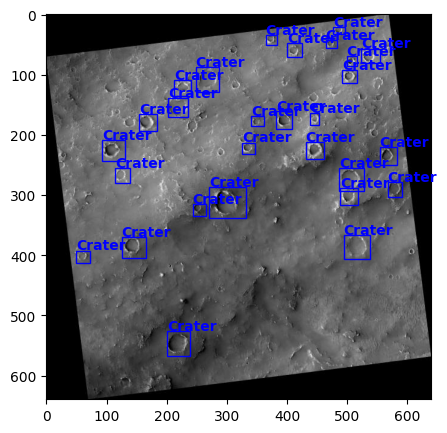

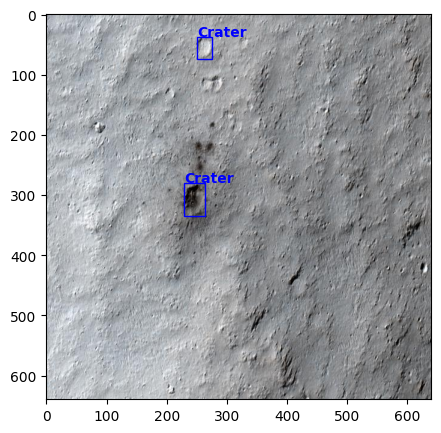

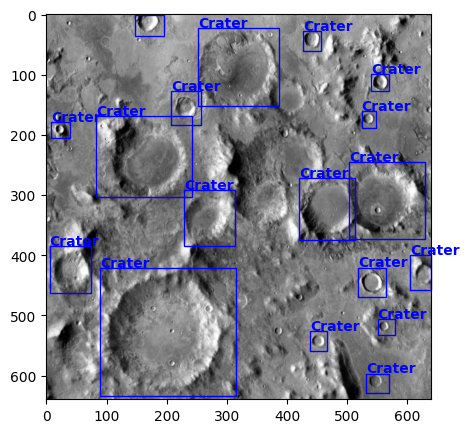

In [ ]:
dataset = CraterDataset('/content/craters/train', get_transform(train=True))
# Prints an example of image with annotations
for i in random.sample(range(1, 100), 3):
    img, target = dataset[i]
    plot_img_bbox(img, target)

PART 5

In [6]:
# Train on GPU or CPU, if GPU is not available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
k_folds = 5
num_epochs = 4

# Número de clases en tu conjunto de datos
num_classes = 2

# Utiliza tu dataset y transformaciones definidas
dataset = CraterDataset('/content/craters/train', get_transform(train=True))
dataset_val = CraterDataset('/content/craters/train', get_transform(train=False))

# Define el K-fold Cross Validator
kfold = KFold(n_splits=k_folds, shuffle=True)

# Comienza la impresión
print('--------------------------------')

# Evaluación del modelo en Validación Cruzada K-fold
for fold, (train_ids, val_ids) in enumerate(kfold.split(dataset)):
    print(f'FOLD {fold}')
    print('--------------------------------')

    dataset_subset = torch.utils.data.Subset(dataset, list(train_ids))
    dataset_val_subset = torch.utils.data.Subset(dataset_val, list(val_ids))

    # Define los dataloaders de entrenamiento y validación
    data_loader = torch.utils.data.DataLoader(
        dataset_subset, batch_size=8, shuffle=True, num_workers=2,
        collate_fn=utils.collate_fn)

    data_loader_val = torch.utils.data.DataLoader(
        dataset_val_subset, batch_size=1, shuffle=False, num_workers=2,
        collate_fn=utils.collate_fn)

    # Obtiene el modelo utilizando la función de modelo alternativo
    model = get_model_bbox_alternativo(num_classes)

    # Mueve el modelo al dispositivo correcto
    model.to(device)

    # Construye un optimizador
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0)

    # y un planificador de tasa de aprendizaje
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

    # ¡Comencemos a entrenar!
    for epoch in range(num_epochs):
        # Entrena durante un época, imprimiendo cada 50 iteraciones
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
        # Actualiza la tasa de aprendizaje
        lr_scheduler.step()


--------------------------------
FOLD 0
--------------------------------


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch: [0]  [ 0/10]  eta: 0:00:30  lr: 0.000560  loss: 1.4269 (1.4269)  loss_classifier: 0.9886 (0.9886)  loss_box_reg: 0.2357 (0.2357)  loss_objectness: 0.1763 (0.1763)  loss_rpn_box_reg: 0.0263 (0.0263)  time: 3.0296  data: 0.4897  max mem: 1766
Epoch: [0]  [ 9/10]  eta: 0:00:00  lr: 0.005000  loss: 0.7905 (1.0714)  loss_classifier: 0.2879 (0.5554)  loss_box_reg: 0.2357 (0.2442)  loss_objectness: 0.1763 (0.2274)  loss_rpn_box_reg: 0.0377 (0.0445)  time: 0.6124  data: 0.0747  max mem: 1988
Epoch: [0] Total time: 0:00:06 (0.6180 s / it)
Epoch: [1]  [ 0/10]  eta: 0:00:07  lr: 0.005000  loss: 0.6394 (0.6394)  loss_classifier: 0.2133 (0.2133)  loss_box_reg: 0.1896 (0.1896)  loss_objectness: 0.1834 (0.1834)  loss_rpn_box_reg: 0.0531 (0.0531)  time: 0.7790  data: 0.3896  max mem: 1988
Epoch: [1]  [ 9/10]  eta: 0:00:00  lr: 0.005000  loss: 0.4889 (0.5643)  loss_classifier: 0.1759 (0.1935)  loss_box_reg: 0.1748 (0.2025)  loss_objectness: 0.1080 (0.1272)  loss_rpn_box_reg: 0.0386 (0.0411)  tim

En el código de entrenamiento, hemos mantenido gran parte de la estructura original proporcionada por nuestro profesor. Sin embargo, hemos adaptado la función get_model_bbox_alternativo en lugar de get_model_bbox para cargar nuestro modelo preferido.

Consideraciones sobre las transformaciones: Es importante tener en cuenta que las transformaciones de datos pueden variar según el modelo de detección utilizado. En este caso, hemos asumido que las transformaciones son adecuadas para fasterrcnn_mobilenet_v3_large_fpn, pero es esencial revisar y ajustar estas transformaciones según las necesidades de tu proyecto y el nuevo modelo.

Dispositivo de entrenamiento: Hemos agregado la verificación del dispositivo de entrenamiento con la línea device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'). Esto asegura que el código se ejecute en una GPU si está disponible y, de lo contrario, en la CPU.

Optimizador y planificador de tasa de aprendizaje: Hemos conservado la configuración del optimizador y el planificador de tasa de aprendizaje proporcionados por nuestro profesor. Estos hiperparámetros pueden requerir ajustes según tu proyecto específico.

Bucle de entrenamiento: El bucle de entrenamiento sigue siendo el mismo, donde entrenamos el modelo durante varias épocas y actualizamos la tasa de aprendizaje. Puedes ajustar el número de épocas y otros hiperparámetros según tus necesidades.

PART 6

In [8]:
num_epochs = 20

# our dataset has two classes only - background and crater
num_classes = 2
# use our dataset and defined transformations
dataset = CraterDataset('/content/craters/train', get_transform(train=True))
dataset_test = CraterDataset('/content/craters/test', get_transform(train=False))

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
        dataset, batch_size=8, shuffle=True, num_workers=2,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

# get the model using our helper function
model = get_model_bbox_alternativo(num_classes)
'''
Use this to reset all trainable weights
model.apply(reset_weights)
'''

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,  # Feel free to play with values
                            momentum=0.9, weight_decay=0)

# Defining learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size=20,
                                                gamma=0.2)


result_mAP = []
best_epoch = None
# Let's train!
for epoch in range(num_epochs):


    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
    # update the learning rate
    lr_scheduler.step()

        # Saving the last model
save_path = os.path.join(f'Crater_noaug_sgd_2batch-lastepoch{num_epochs-1}.pth')
torch.save(model.state_dict(), save_path)
print(f'model from last epoch(no.{num_epochs-1}) saved')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch: [0]  [ 0/13]  eta: 0:00:11  lr: 0.000421  loss: 1.9747 (1.9747)  loss_classifier: 1.4097 (1.4097)  loss_box_reg: 0.3272 (0.3272)  loss_objectness: 0.1902 (0.1902)  loss_rpn_box_reg: 0.0476 (0.0476)  time: 0.8772  data: 0.4944  max mem: 1990
Epoch: [0]  [12/13]  eta: 0:00:00  lr: 0.005000  loss: 0.7394 (0.9771)  loss_classifier: 0.2550 (0.4748)  loss_box_reg: 0.2635 (0.2490)  loss_objectness: 0.1594 (0.2085)  loss_rpn_box_reg: 0.0382 (0.0448)  time: 0.4129  data: 0.0709  max mem: 1990
Epoch: [0] Total time: 0:00:05 (0.4187 s / it)
Epoch: [1]  [ 0/13]  eta: 0:00:10  lr: 0.005000  loss: 0.7340 (0.7340)  loss_classifier: 0.2469 (0.2469)  loss_box_reg: 0.2395 (0.2395)  loss_objectness: 0.2070 (0.2070)  loss_rpn_box_reg: 0.0406 (0.0406)  time: 0.7922  data: 0.4017  max mem: 1990
Epoch: [1]  [12/13]  eta: 0:00:00  lr: 0.005000  loss: 0.4557 (0.4851)  loss_classifier: 0.1603 (0.1643)  loss_box_reg: 0.1890 (0.1817)  loss_objectness: 0.1010 (0.1057)  loss_rpn_box_reg: 0.0345 (0.0335)  tim

Hemos modificado el Modelo, para evaluarlo con el alternativo.

PART 7

In [10]:
dataset_test = CraterDataset('/content/craters/test', get_transform(train=False))

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

model = get_model_bbox_alternativo(num_classes)

# load model to evaluate
model.load_state_dict(torch.load(os.path.join(f'Crater_noaug_sgd_2batch-lastepoch{num_epochs-1}.pth'),map_location=device))
model.to(device)




/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

In [11]:
# Define colors for bounding boxes
color_inference = np.array([0.0,0.0,255.0])
color_label = np.array([255.0,0.0,0.0])

# Score value thershold for displaying predictions
detection_threshold = 0.7
# to count the total number of images iterated through
frame_count = 0

# to keep adding the FPS for each image
total_fps = 0

!mkdir ./results

En la sisguiente funcion, hemos puesto que el nuevo modelo se vea en verde.

mkdir: cannot create directory ‘./results’: File exists


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


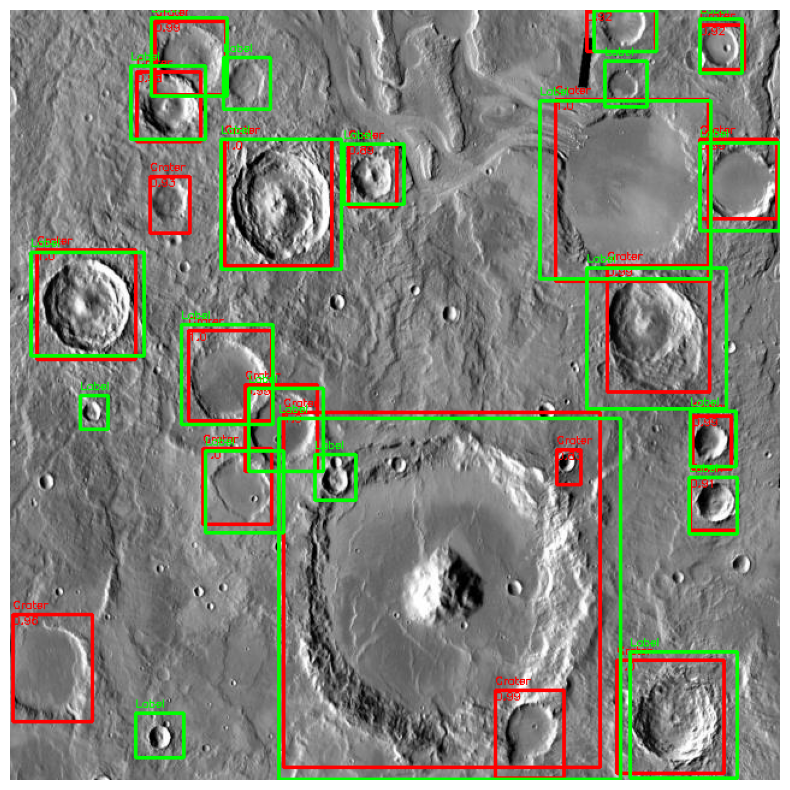

Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


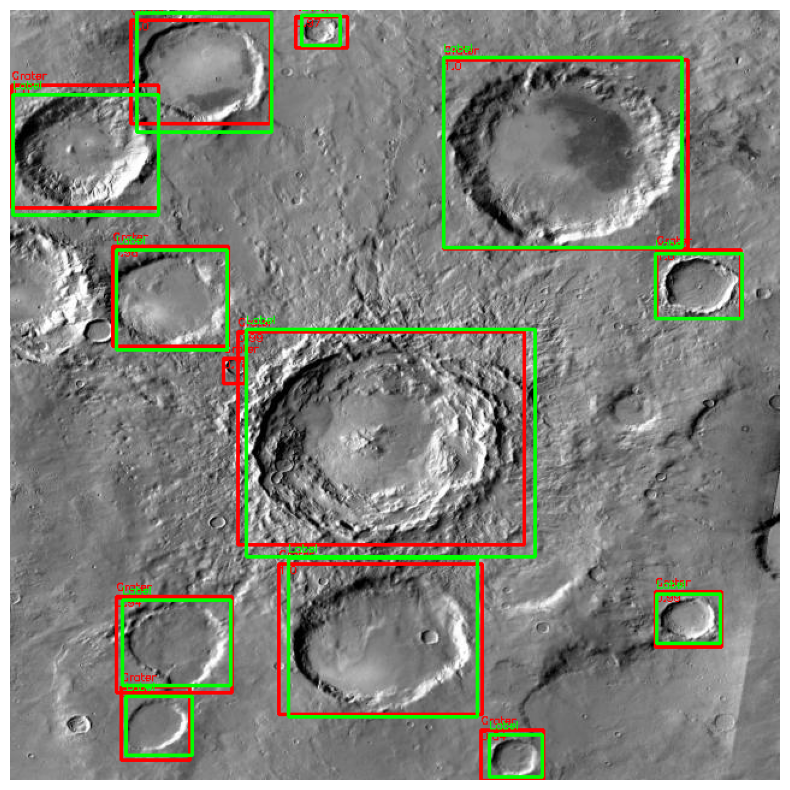

Image 2 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


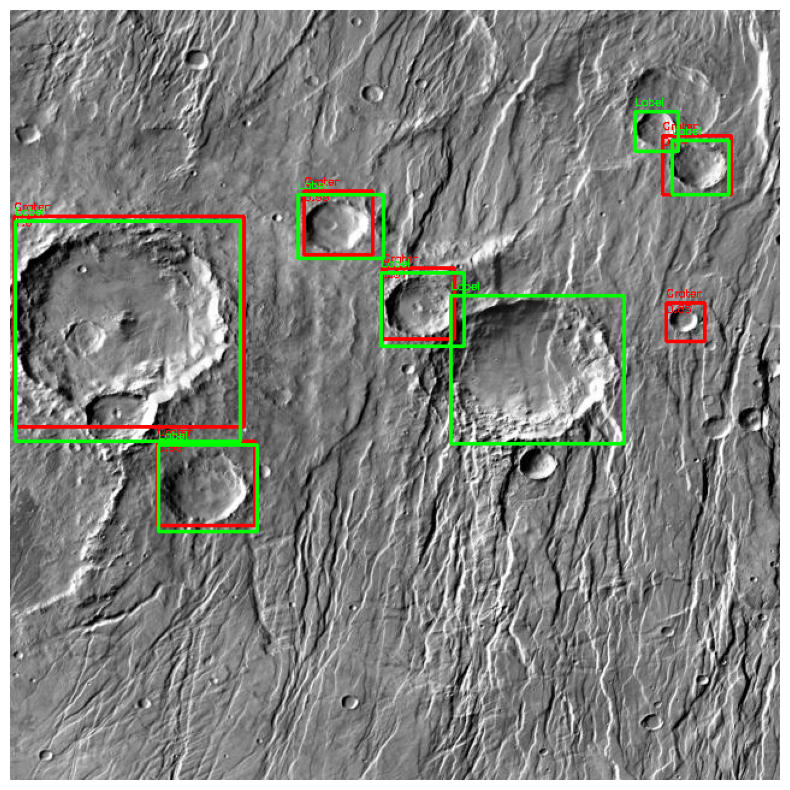

Image 3 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


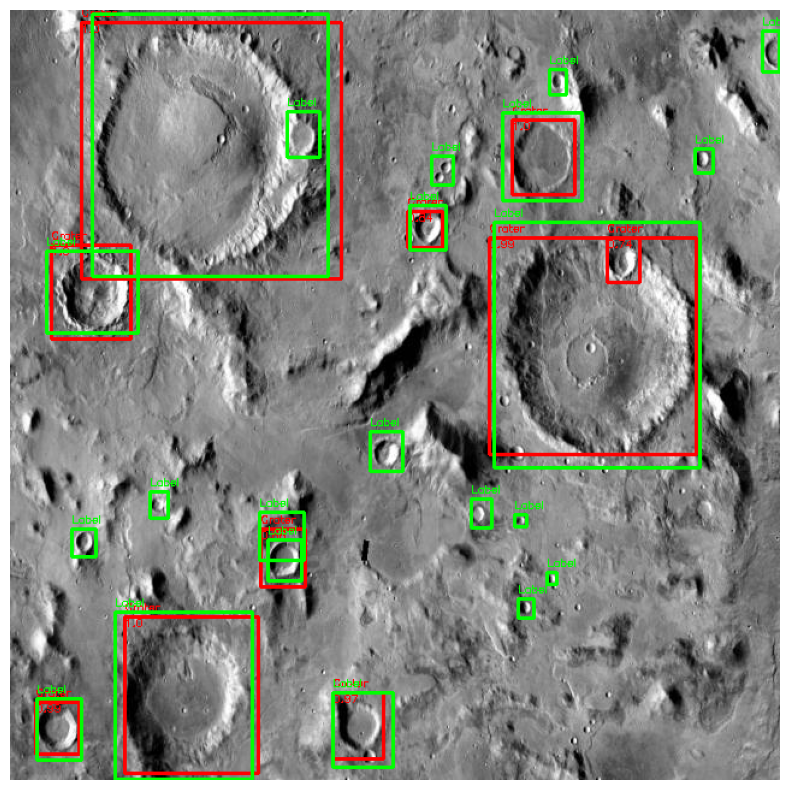

Image 4 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


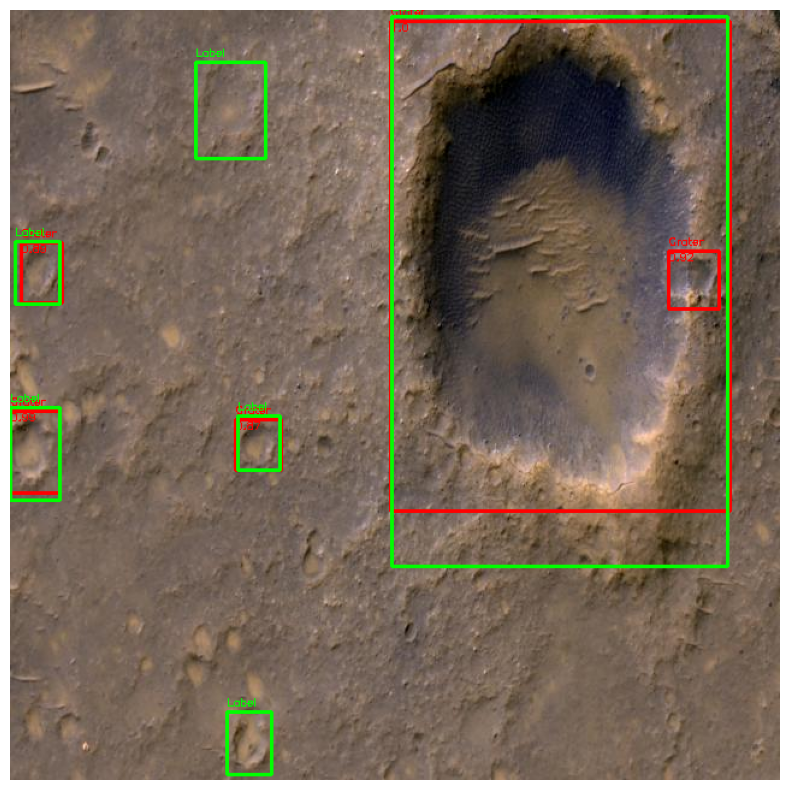

Image 5 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


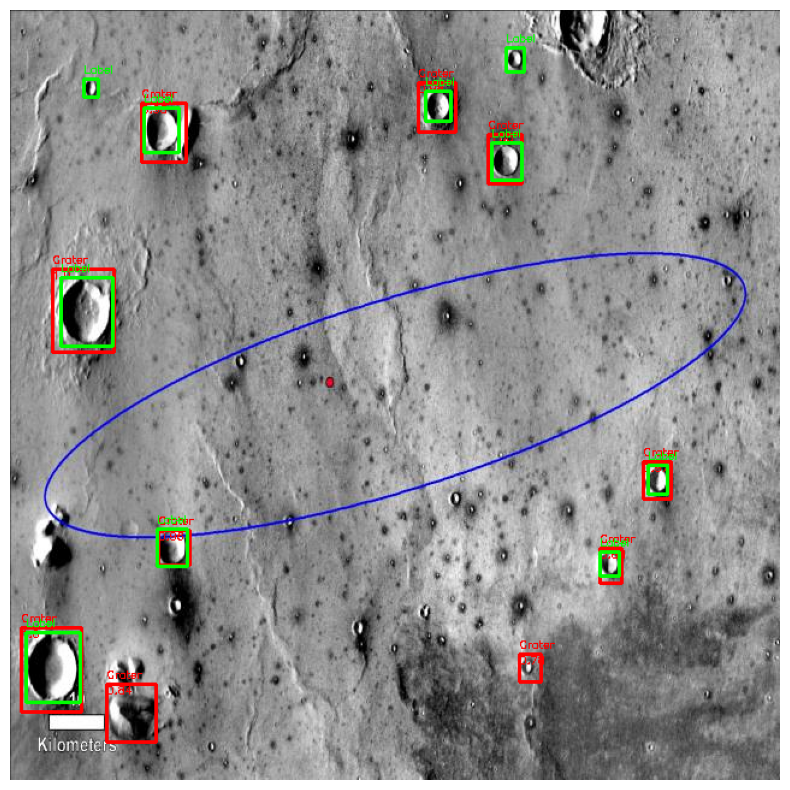

Image 6 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


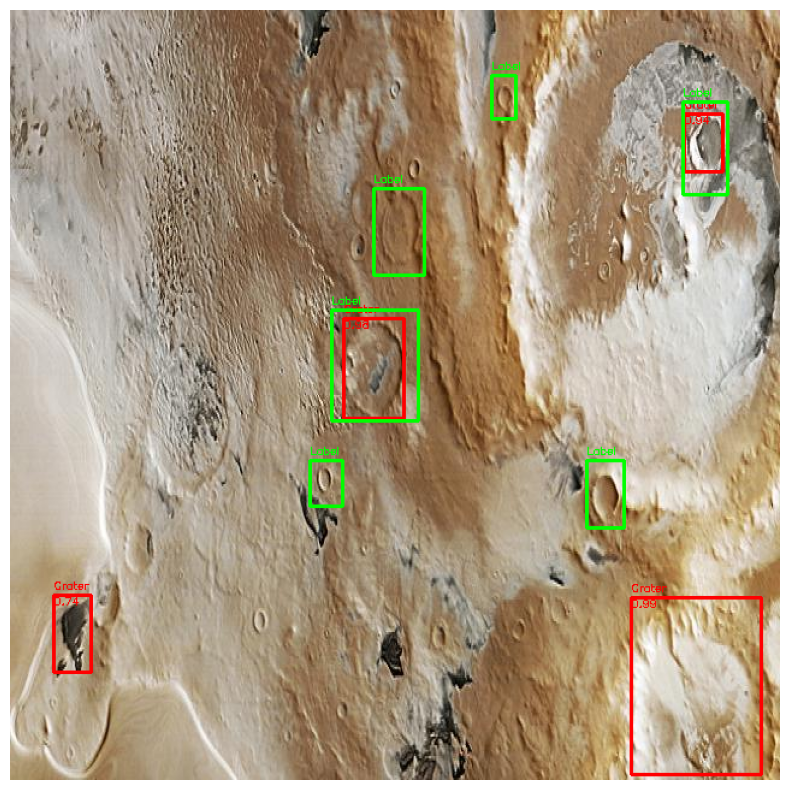

Image 7 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


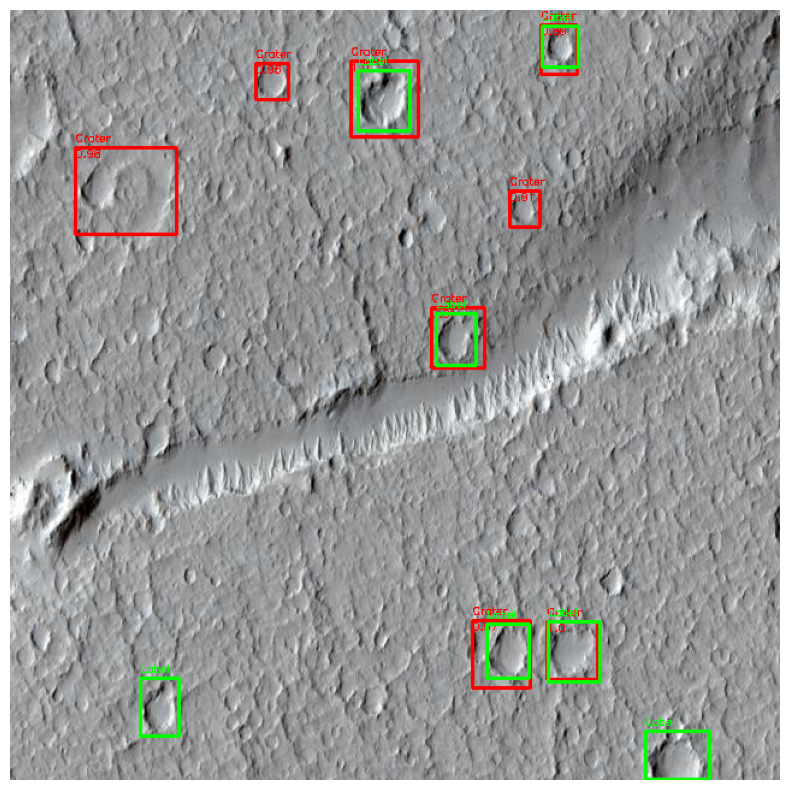

Image 8 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


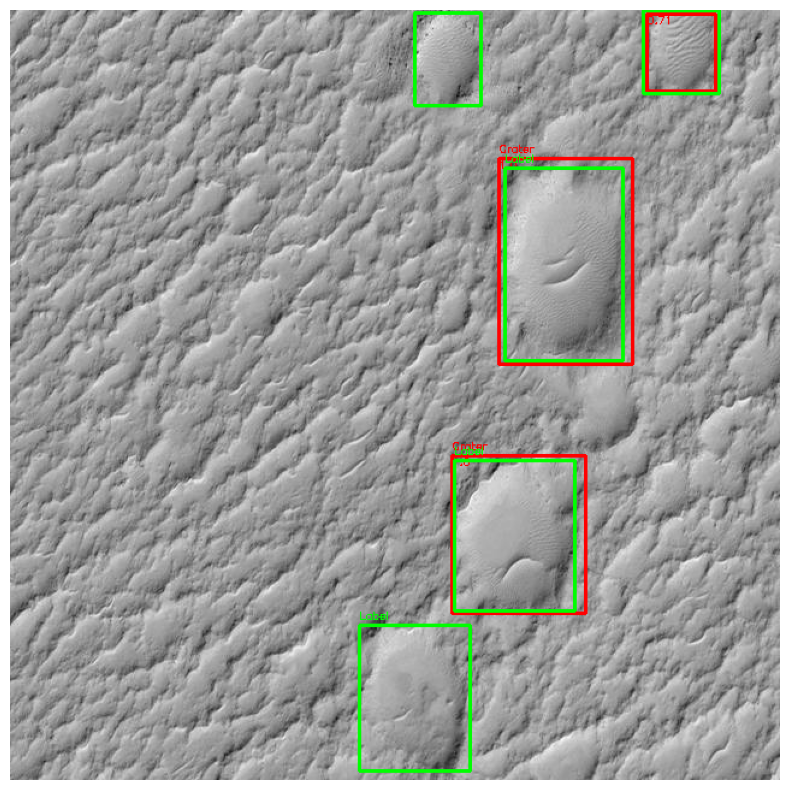

Image 9 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


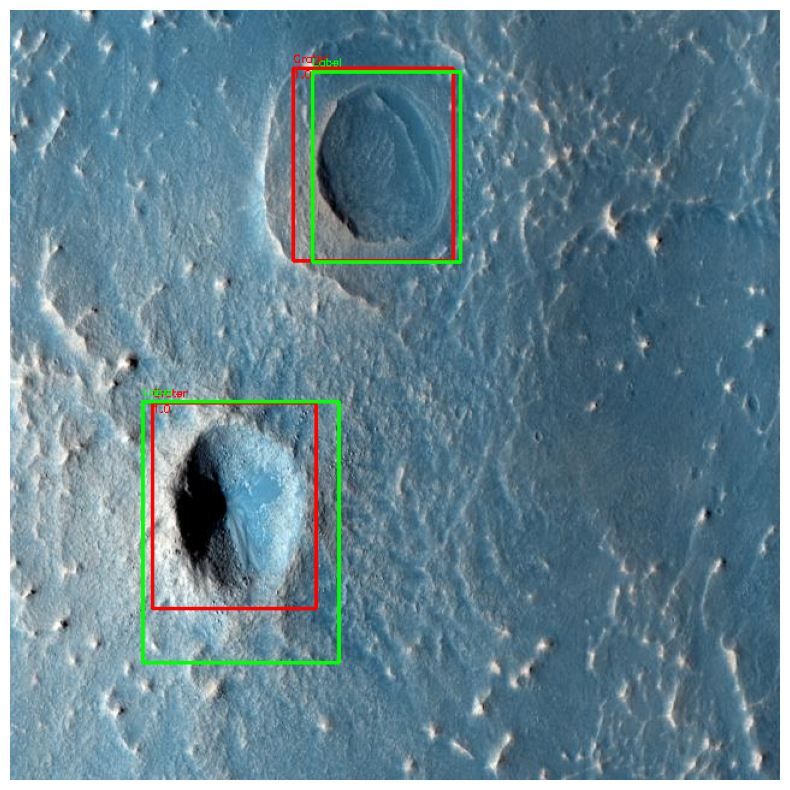

Image 10 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


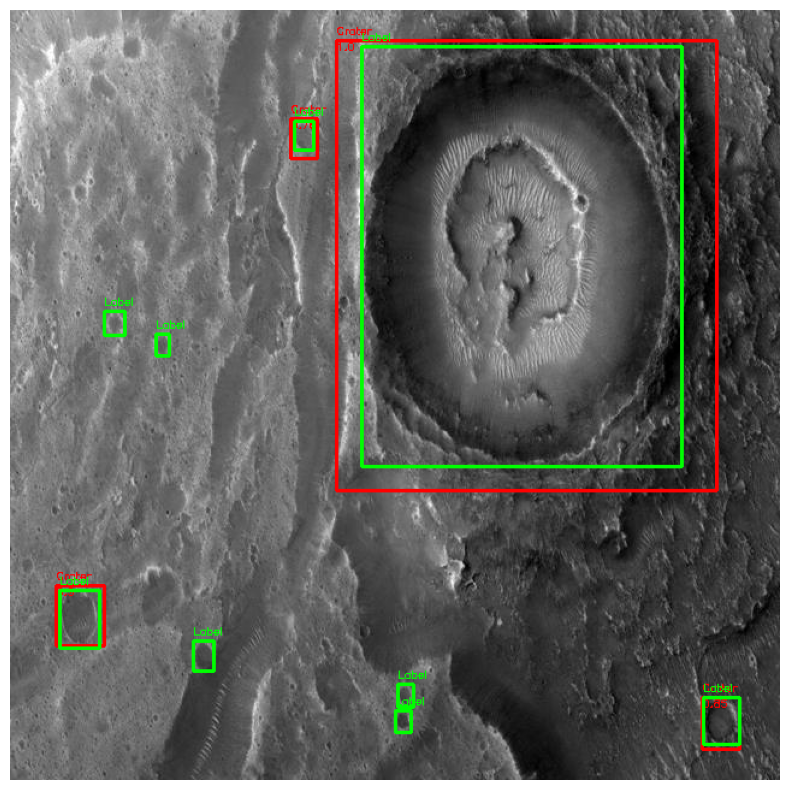

Image 11 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


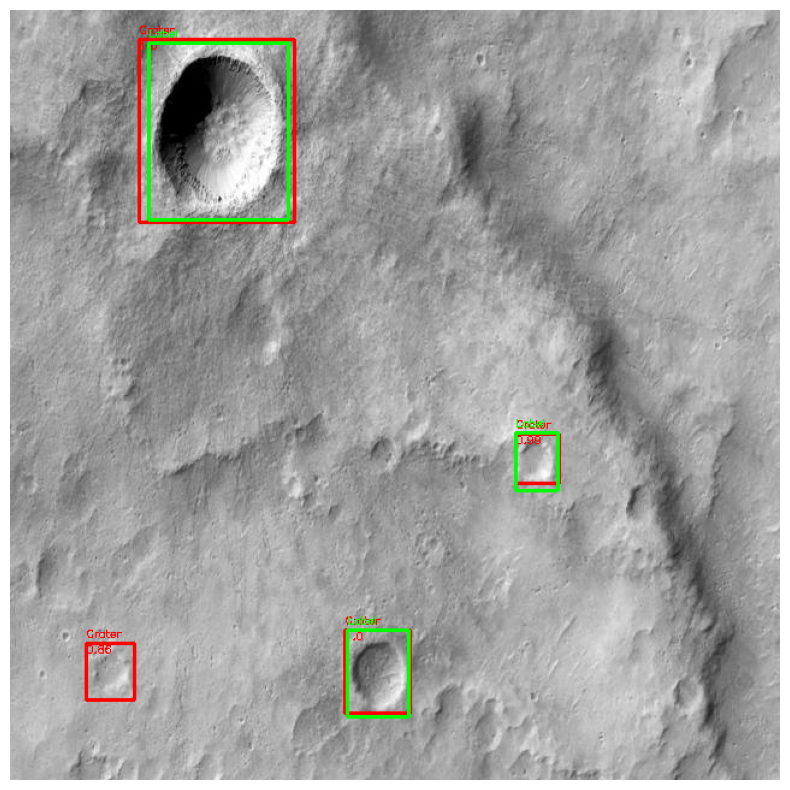

Image 12 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


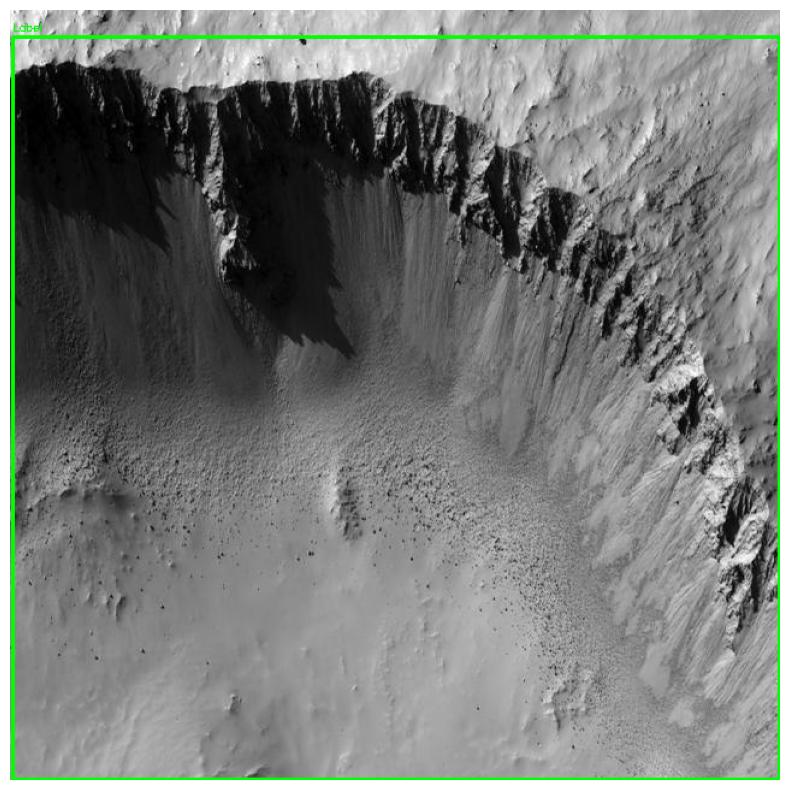

Image 13 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


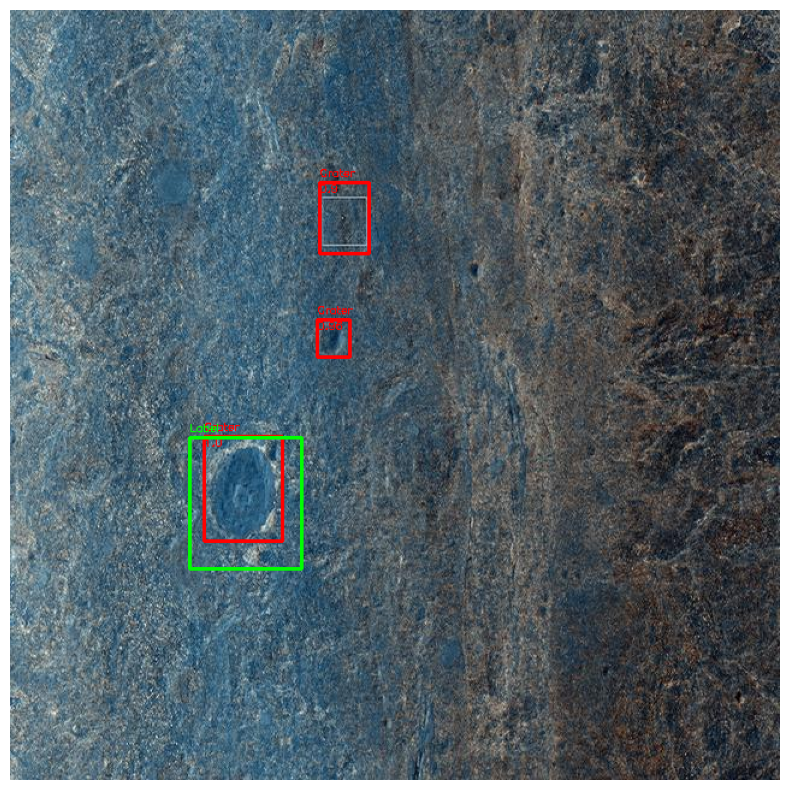

Image 14 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


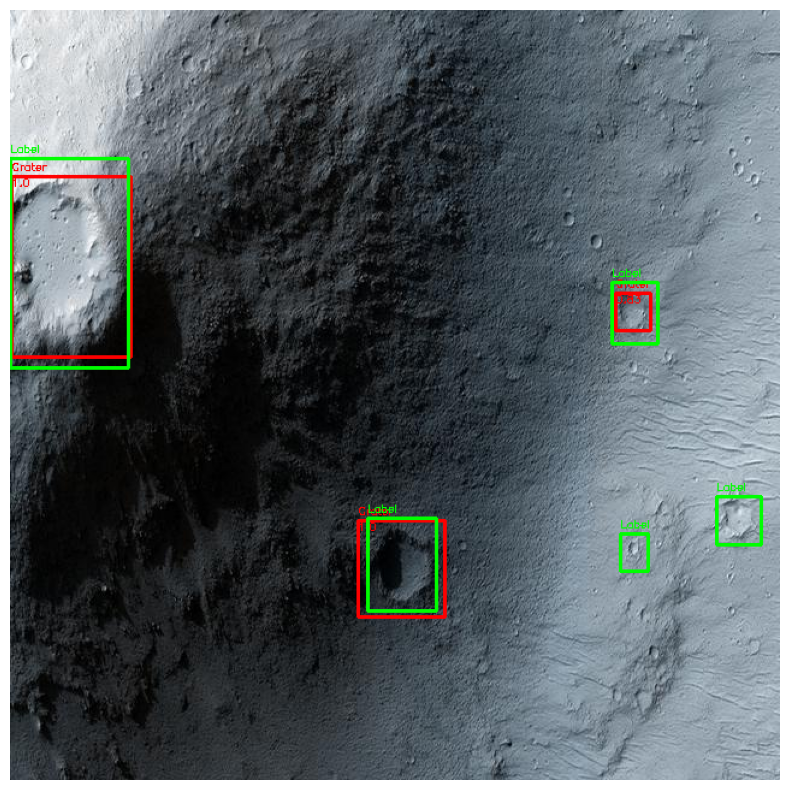

Image 15 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


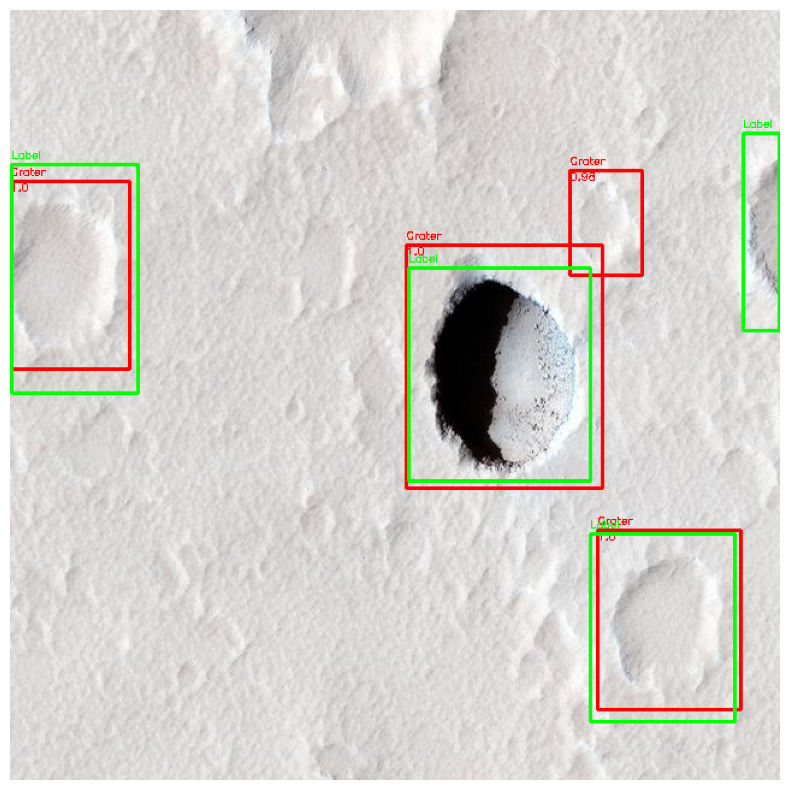

Image 16 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


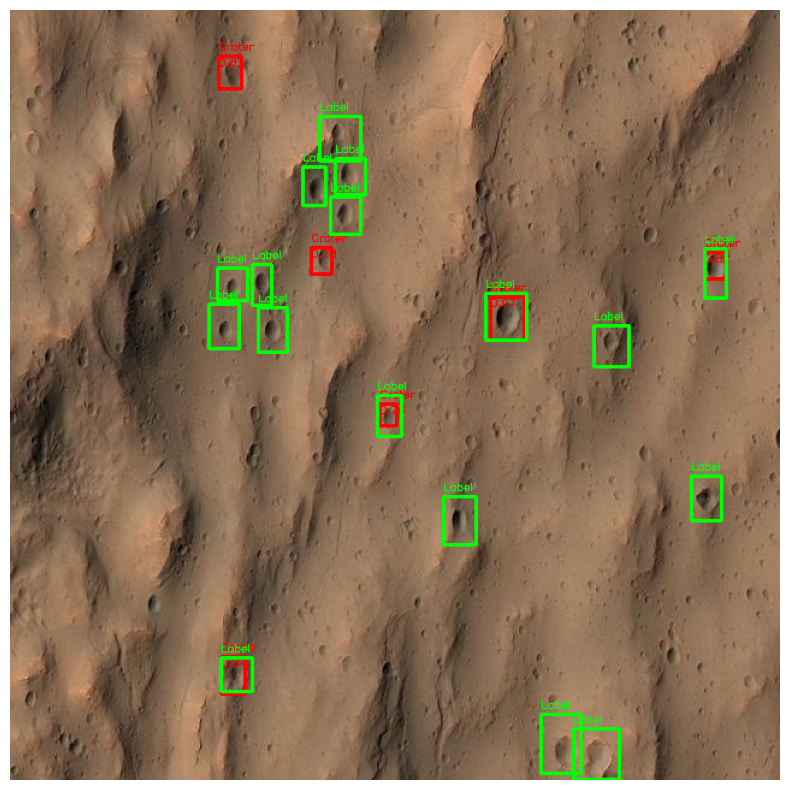

Image 17 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


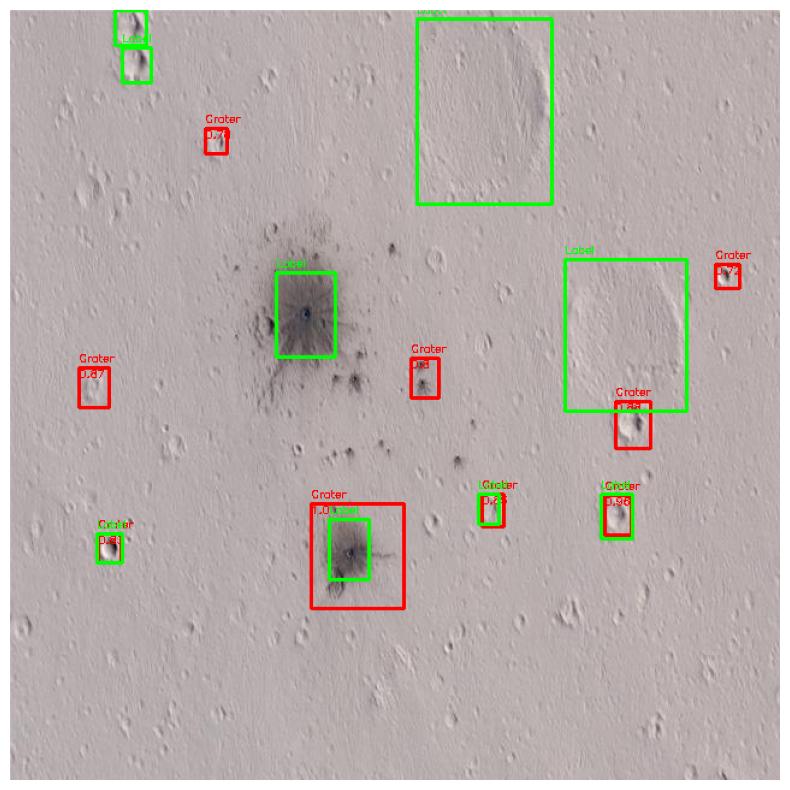

Image 18 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


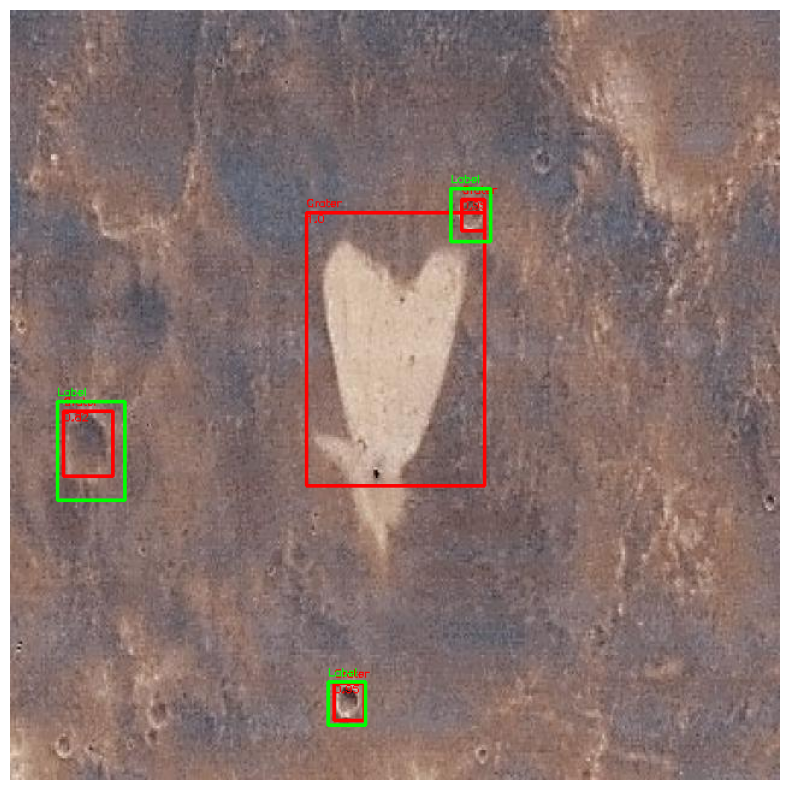

Image 19 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 15.116


In [14]:
# Define colors for bounding boxes
color_inference = np.array([0.0, 0.0, 255.0])
color_label = np.array([0.0, 255.0, 0.0])

# Score value threshold for displaying predictions
detection_threshold = 0.7
# to count the total number of images iterated through
frame_count = 0
# to keep adding the FPS for each image
total_fps = 0

!mkdir ./results

dataset_test = CraterDataset('/content/craters/test', get_transform(train=False))

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

model = get_model_bbox_alternativo(num_classes)

# load model to evaluate
model.load_state_dict(torch.load(os.path.join(f'Crater_noaug_sgd_2batch-lastepoch{num_epochs-1}.pth'), map_location=device))
model.to(device)

# Cambiar el modelo al modo de evaluación
model.eval()

for i, data in enumerate(data_loader_test):
    # get the image file name for predictions file name
    image_name = 'image no:' + str(int(data[1][0]['image_id']))
    model_image = data[0][0]
    cv2_image = np.transpose(model_image.numpy() * 255, (1, 2, 0)).astype(np.float32)
    cv2_image = cv2.cvtColor(cv2_image, cv2.COLOR_RGB2BGR).astype(np.float32)

    # add batch dimension
    model_image = torch.unsqueeze(model_image, 0)
    start_time = time.time()
    with torch.no_grad():
        outputs = model(model_image.to(device))
    end_time = time.time()
    # get the current fps
    fps = 1 / (end_time - start_time)
    # add `fps` to `total_fps`
    total_fps += fps
    # increment frame count
    frame_count += 1
    # load all detections to CPU for further operations
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    # carry further only if there are detected boxes
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        # filter out boxes according to `detection_threshold`
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = np.round(scores[scores >= detection_threshold], 2)
        draw_boxes = boxes.copy()

        # draw the bounding boxes and write the class name on top of it
        for j, box in enumerate(draw_boxes):
            cv2.rectangle(cv2_image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          color_inference, 2)
            cv2.putText(img=cv2_image, text="Crater",
                        org=(int(box[0]), int(box[1] - 5)),
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.3, color=color_inference,
                        thickness=1, lineType=cv2.LINE_AA)
            cv2.putText(img=cv2_image, text=str(scores[j]),
                        org=(int(box[0]), int(box[1] + 8)),
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.3, color=color_inference,
                        thickness=1, lineType=cv2.LINE_AA)
        # add boxes for labels
        for box in data[1][0]['boxes']:
            cv2.rectangle(cv2_image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          color_label, 2)
            cv2.putText(img=cv2_image, text="Label",
                        org=(int(box[0]), int(box[1] - 5)),
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.3, color=color_label,
                        thickness=1, lineType=cv2.LINE_AA)

        # set size
        plt.figure(figsize=(10, 10))
        plt.axis("off")

        # convert color from CV2 BGR back to RGB
        plt_image = cv2.cvtColor(cv2_image / 255.0, cv2.COLOR_BGR2RGB)
        plt.imshow(plt_image)
        plt.show()
        cv2.imwrite(f"./results/{image_name}.jpg", cv2_image)
    print(f"Image {i + 1} done...")
    print('-' * 50)
    print('TEST PREDICTIONS COMPLETE')

avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")


Nuevo Modelo de Predicción:

En lugar de utilizar el modelo de detección RetinaNet que proporcionó nuestro profesor, optamos por entrenar y utilizar un modelo diferente llamado fasterrcnn_mobilenet_v3_large_fpn de la biblioteca TorchVision. La elección de este modelo se debe a sus características específicas:

fasterrcnn_mobilenet_v3_large_fpn utiliza una arquitectura de red neuronal más ligera basada en MobileNetV3, lo que lo hace más eficiente en términos de recursos computacionales.
A pesar de su menor tamaño, es capaz de mantener un buen rendimiento en tareas de detección de objetos.
Esta elección es especialmente útil cuando tenemos un conjunto de datos de imágenes más pequeño o necesitamos una detección de objetos rápida en aplicaciones con recursos limitados.
Resumen de los Cambios Realizados:

A lo largo del desarrollo de nuestro proyecto, realizamos varios cambios significativos en el código proporcionado por nuestro profesor. Aquí tienes un resumen de los cambios más destacados:

Cambio de Modelo: Sustituimos el modelo RetinaNet por fasterrcnn_mobilenet_v3_large_fpn en el código de entrenamiento. Esta elección se basa en la eficiencia y el rendimiento del nuevo modelo.

Adaptación del Código: Realizamos adaptaciones en el código para que funcione con el nuevo modelo, incluyendo cambios en la carga de datos, optimización y planificación de la tasa de aprendizaje.

Creación de un Video de Predicciones: En lugar de guardar imágenes estáticas, modificamos el código para crear un video que muestra las predicciones resaltadas en cada cuadro.

Cambios en los Colores y Umbrales: Ajustamos los colores utilizados para resaltar las predicciones y el umbral de detección para mostrar solo predicciones con una confianza por encima del umbral especificado.

Cálculo del FPS Promedio: Añadimos código para calcular el promedio de cuadros por segundo (FPS) y lo mostramos al final del proceso de evaluación.